># Time series : Energy consumption 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
import statsmodels.api as sm


#Data reading
Ts = pd.read_csv("TimeSeries.csv")
Ts

,NAME,BEGIN,END,KWH_PERIOD
0,0007BR,01/01/2019,31/01/2019,2 500
1,0007BR,01/02/2019,28/02/2019,2 227
2,0007BR,01/03/2019,31/03/2019,2 538
3,0007BR,01/04/2019,30/04/2019,2 520
4,0007BR,01/05/2019,31/05/2019,2 581
...,...,...,...,...
3215,1911BB,01/07/2021,31/07/2021,1 768
3216,1911BB,01/08/2021,31/08/2021,1 747
3217,1911BB,01/09/2021,30/09/2021,1 676
3218,1911BB,01/10/2021,31/10/2021,1 709


In [2]:
Ts.dtypes

NAME          object
BEGIN         object
END           object
KWH_PERIOD    object
dtype: object

In [3]:
for col in Ts.columns.values:
  print(col, end="\n\n")
  print(Ts[col].unique(), end="\n\n ***********************************\n\n")

NAME

['0007BR' '0024KO' '0089KO' '0147KO' '0254BB' '0274BR' '0356KO' '0357KO'
 '0414BB' '0480BR' '0487BR' '0495BR' '0499BR' '1001BR' '1002BR' '1003BR'
 '1007BR' '1012BR' '1016BR' '1017BR' '1019BR' '1023BR' '1026BR' '1029BR'
 '1033BR' '2106BB' '0998BR' '1024BR' '0611BR' '0628BR' '0483BB' '1037BR'
 '1013BR' '1003BB' '1143BR' '0417KO' '0484BB' '0486BB' '0489BB' '0490BB'
 '0487BB' '0719BR' '0494BB' '0496BB' '1001BB' '1004BB' '0495BB' '1034BB'
 '1032BB' '1033BB' '1006BB' '1011BB' '1015BB' '1016BB' '1020BB' '1021BB'
 '1029BB' '0485KO' '1037BB' '0487KO' '0489KO' '0663BR' '1004KO' '0495KO'
 '0493KO' '1002KO' '0492KO' '1009KO' '1017KO' '1018KO' '1019KO' '1021KO'
 '1020KO' '1024KO' '1014KO' '1016KO' '0488BB' '0573BB' '1012KO' '1240BR'
 '1037KO' '1028KO' '1986KO' '1067KO' '0690BR' '1978KO' '0694BR' '1088KO'
 '0698BR' '0615BB' '1093KO' '1911BB']

 ***********************************

BEGIN

['01/01/2019' '01/02/2019' '01/03/2019' '01/04/2019' '01/05/2019'
 '01/06/2019' '01/07/2019' '01/08/2019' '

In [4]:
#Since there is only "15/09/2021" date, we simplify the representation by replacing it

Ts["BEGIN"].replace(to_replace="15/09/2021", value="01/09/2021", inplace=True)

>## Removing spaces from objects data types 

In [5]:
Ts["KWH_PERIOD"] = Ts["KWH_PERIOD"].str.replace(" ","")

In [6]:
Ts.KWH_PERIOD.unique()

array(['2500', '2227', '2538', ..., '1701', '1768', '1676'], dtype=object)

>## Converting to timestamp and Integer

In [7]:
Ts['BEGIN'] = pd.to_datetime(Ts['BEGIN'],format="%d/%m/%Y")
Ts['END'] = pd.to_datetime(Ts['END'],format="%d/%m/%Y")
Ts['KWH_PERIOD'] = pd.to_numeric(Ts['KWH_PERIOD'], downcast='signed')

In [8]:
Ts.describe()

,KWH_PERIOD
count,3220.000000
mean,10623.581677
std,58289.748337
min,126.000000
25%,1434.750000
50%,2218.500000
75%,2644.000000
max,593585.000000


>## Data Exploration

In [9]:
Ts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3220 entries, 0 to 3219
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   NAME        3220 non-null   object        
 1   BEGIN       3220 non-null   datetime64[ns]
 2   END         3220 non-null   datetime64[ns]
 3   KWH_PERIOD  3220 non-null   int32         
dtypes: datetime64[ns](2), int32(1), object(1)
memory usage: 88.2+ KB


>### Check for Nan value

In [10]:
Ts.isnull().sum()

NAME          0
BEGIN         0
END           0
KWH_PERIOD    0
dtype: int64

>### Values Count

In [11]:
Ts['NAME'].value_counts()

0007BR    35
1037BB    35
1009KO    35
0492KO    35
1002KO    35
          ..
0611BR    35
1024BR    35
0998BR    35
2106BB    35
1911BB    35
Name: NAME, Length: 92, dtype: int64

In [12]:
Ts['KWH_PERIOD'].value_counts()

2581    9
2727    8
2716    7
2188    7
2647    7
       ..
2712    1
2658    1
2965    1
3133    1
1676    1
Name: KWH_PERIOD, Length: 1910, dtype: int64

In [13]:
Ts['BEGIN'].min(), Ts['END'].max()

(Timestamp('2019-01-01 00:00:00'), Timestamp('2021-11-30 00:00:00'))

In [14]:
df = Ts.groupby('BEGIN')['KWH_PERIOD'].sum().reset_index()
df

,BEGIN,KWH_PERIOD
0,2019-01-01,870500
1,2019-02-01,806182
2,2019-03-01,911794
3,2019-04-01,906096
4,2019-05-01,936541
5,2019-06-01,964690
6,2019-07-01,981724
7,2019-08-01,989951
8,2019-09-01,919682
9,2019-10-01,933435


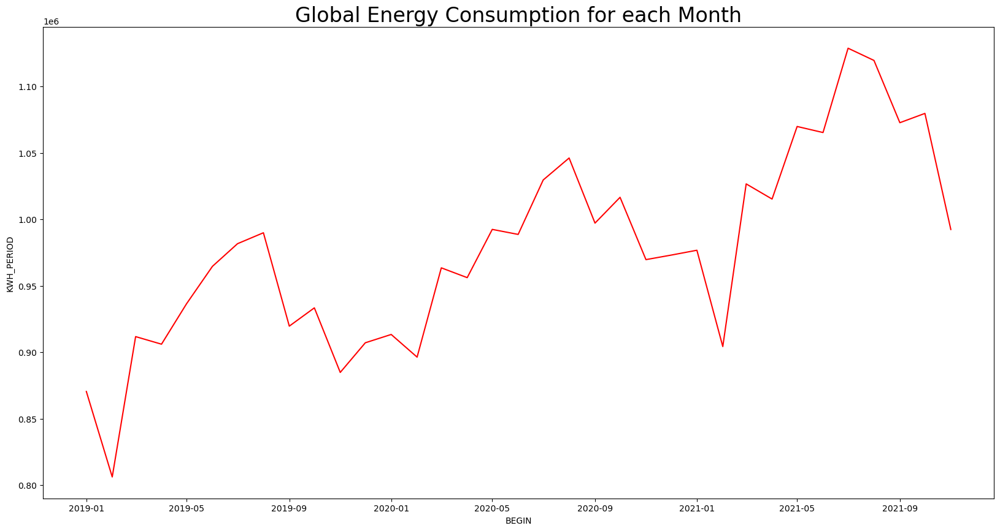

In [15]:
plt.figure(figsize=(20,10))
sns.lineplot(x = "BEGIN" ,y = "KWH_PERIOD",data = df, color="r")
plt.title('Global Energy Consumption for each Month', fontsize=24)
plt.show()

>## Split DataFrame

In [16]:
# set the index to be this and don't drop
#Ts.set_index(keys=['NAME'], drop=False,inplace=True)

# get a list of names
names=Ts['NAME'].unique().tolist()
len(names)

92

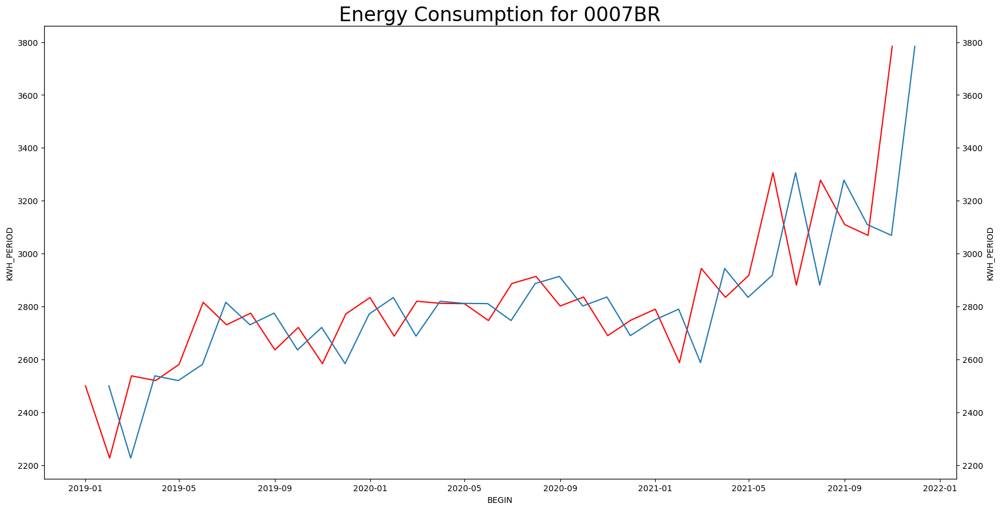

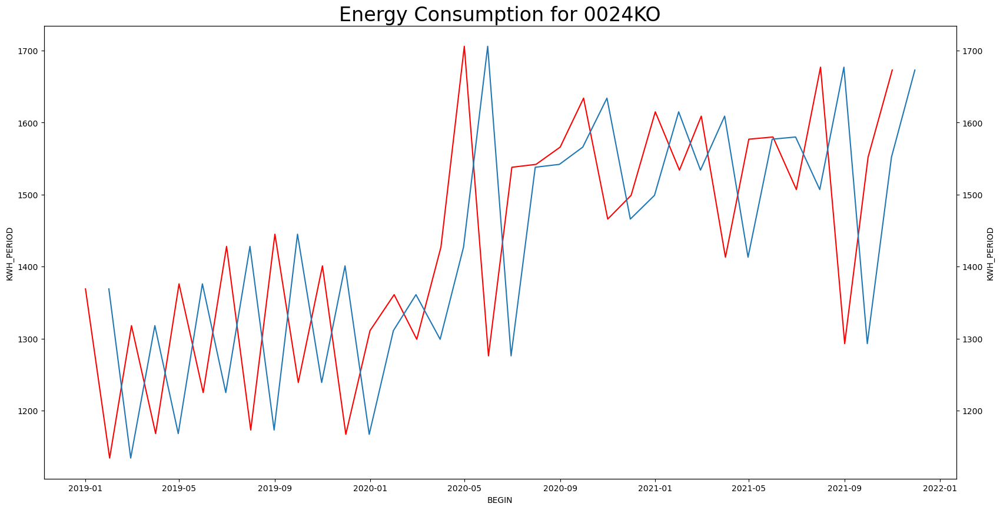

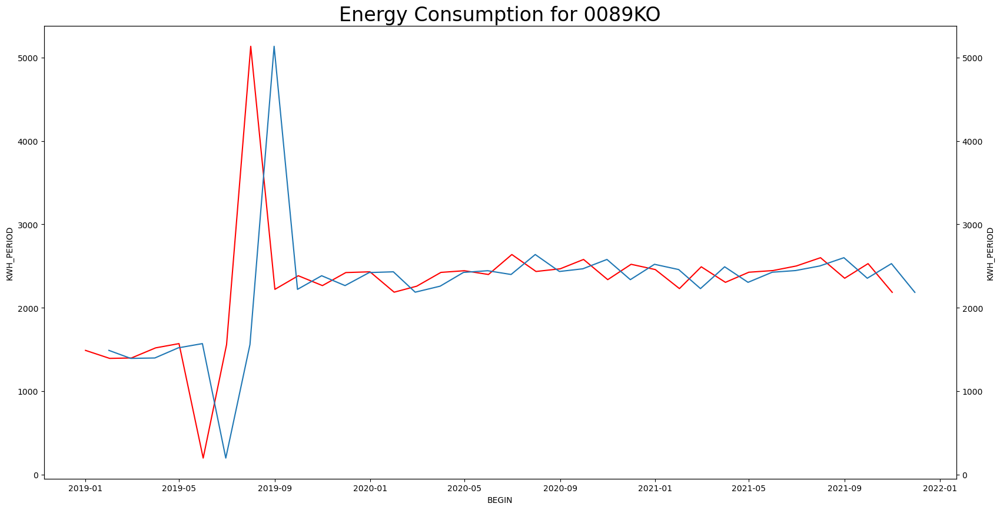

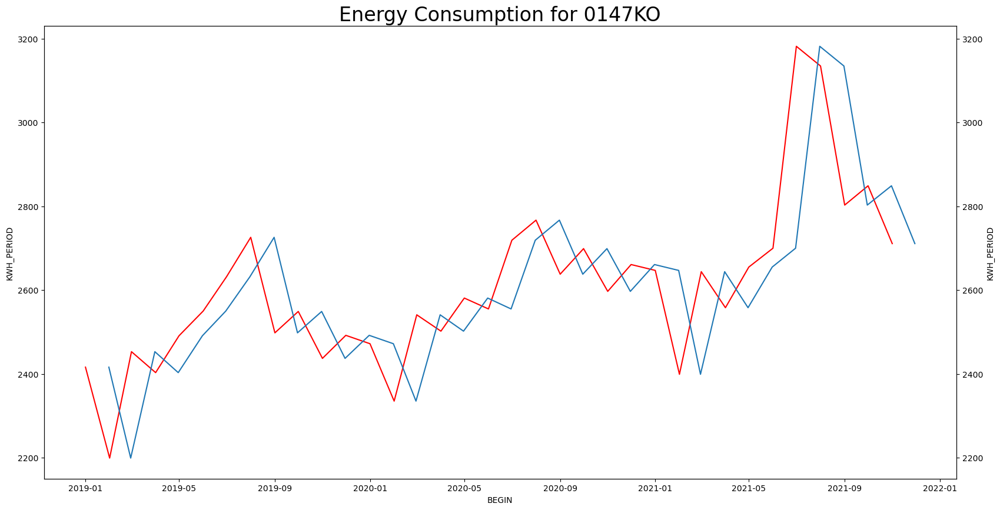

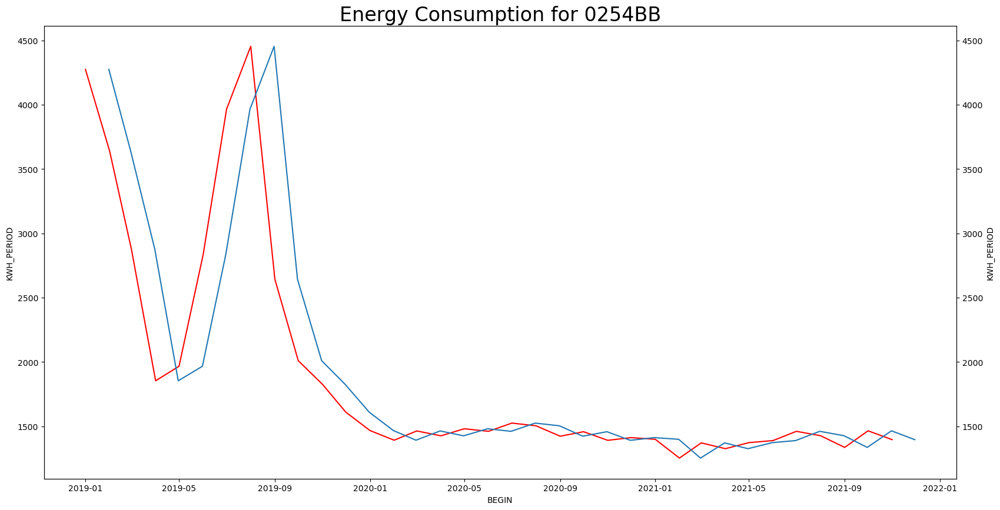

...

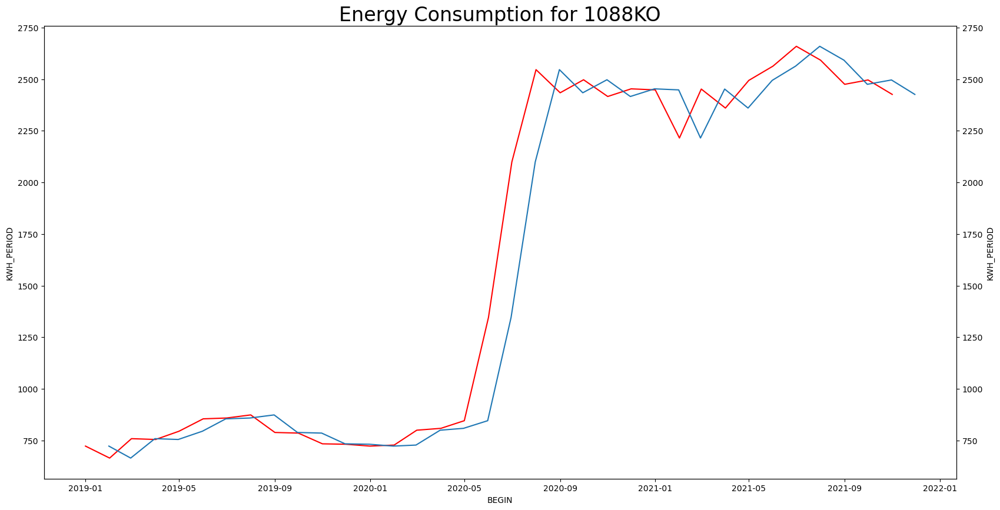

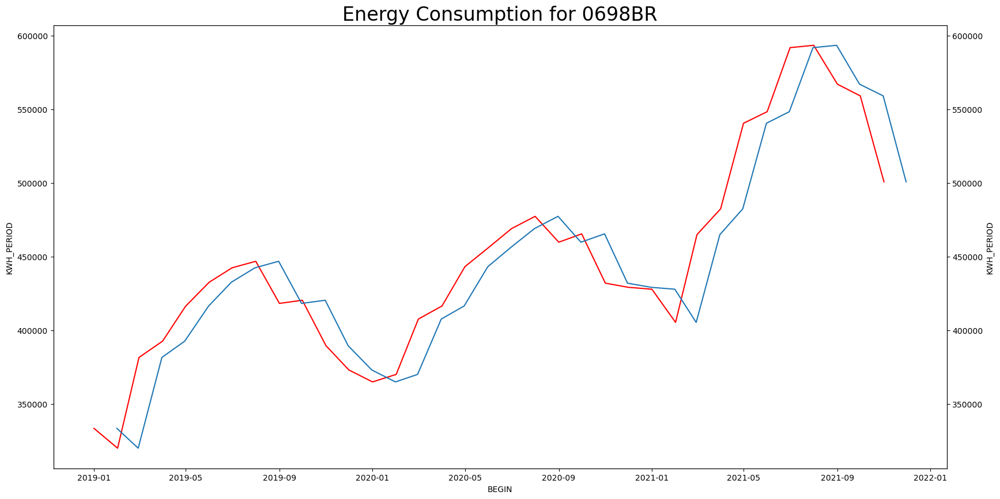

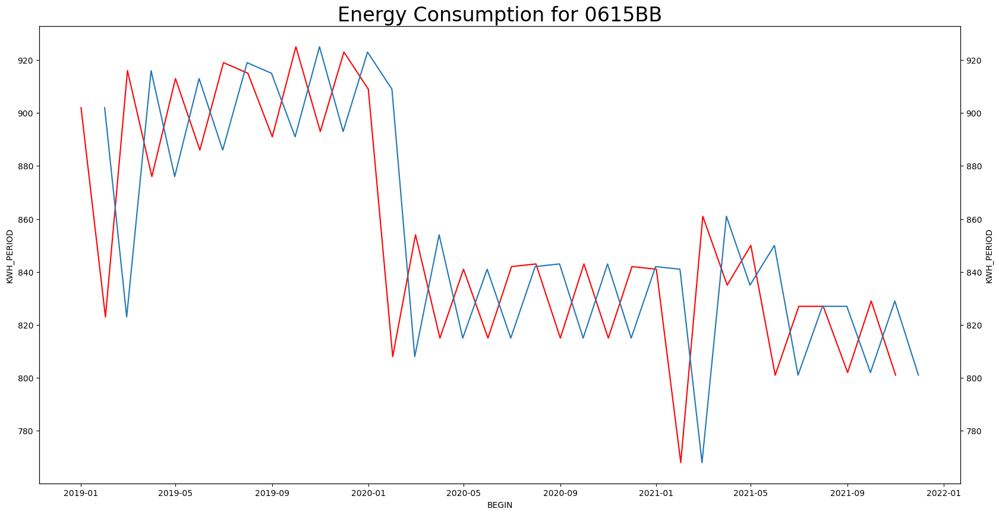

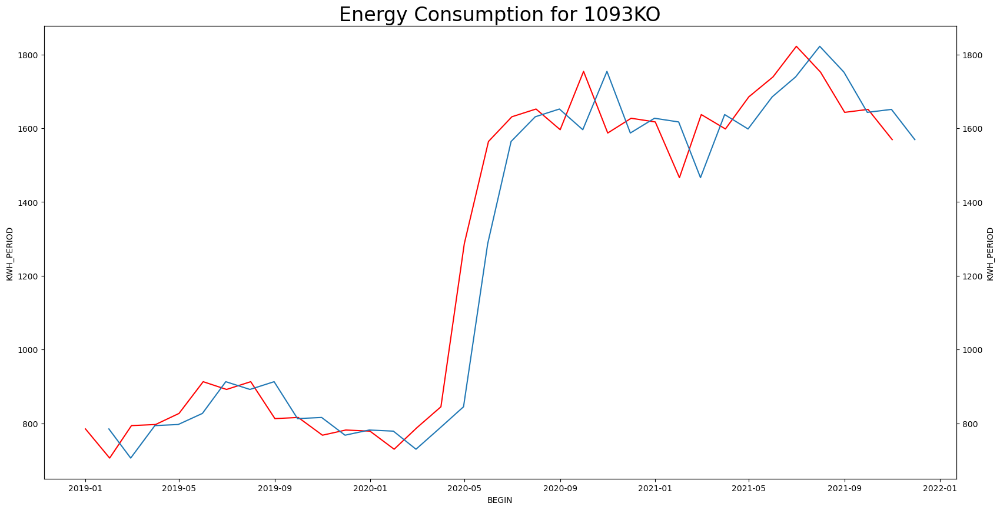

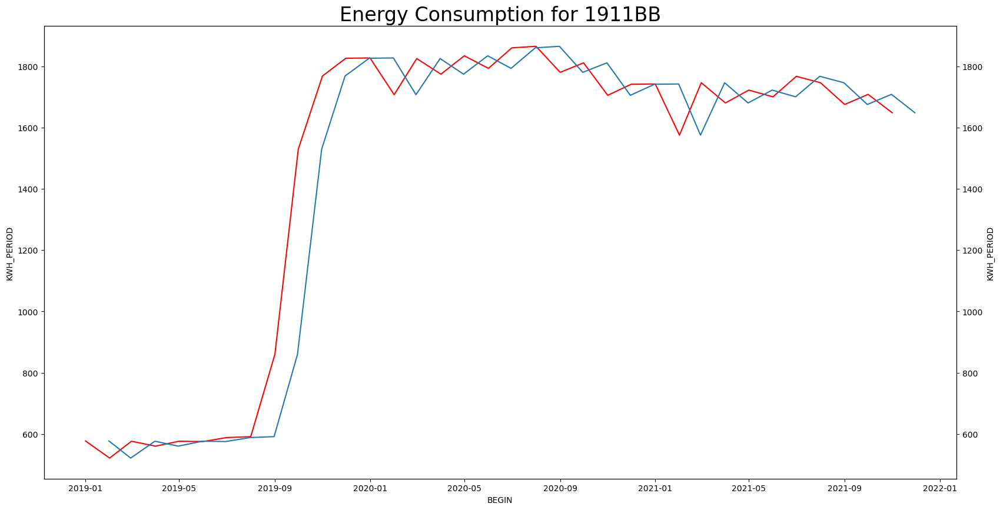

In [17]:
#Plotting Energy consumption for each unique name
for i in names:
    a_i = Ts.loc[Ts.NAME== i]
    plt.figure(figsize=(20,10))
    ax = sns.lineplot(x = "BEGIN" ,y = "KWH_PERIOD",data = a_i, color="r")
    ax2 = ax.twinx()
    sns.lineplot(x = "END" ,y = "KWH_PERIOD",data = a_i)
    plt.title('Energy Consumption for {i}'.format(i=i), fontsize=24)
    plt.show()
    

>## Time series decomposition

In [18]:
f = Ts.set_index('BEGIN')
del f['END']


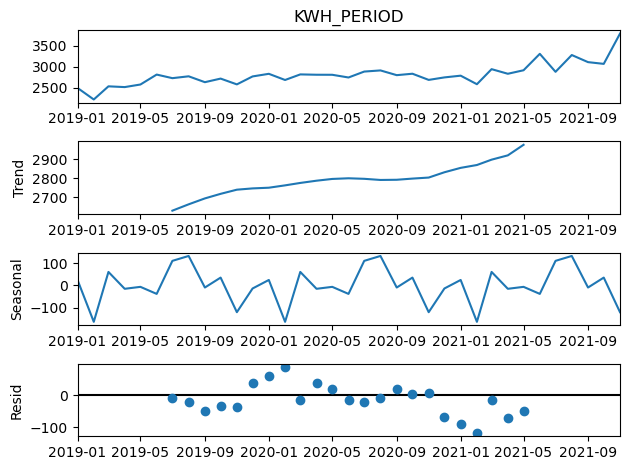

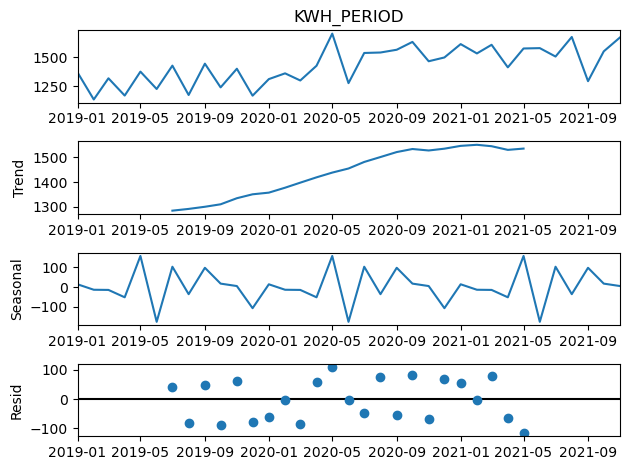

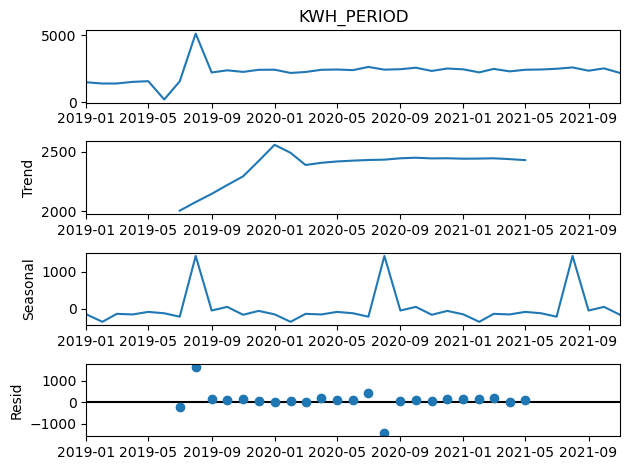

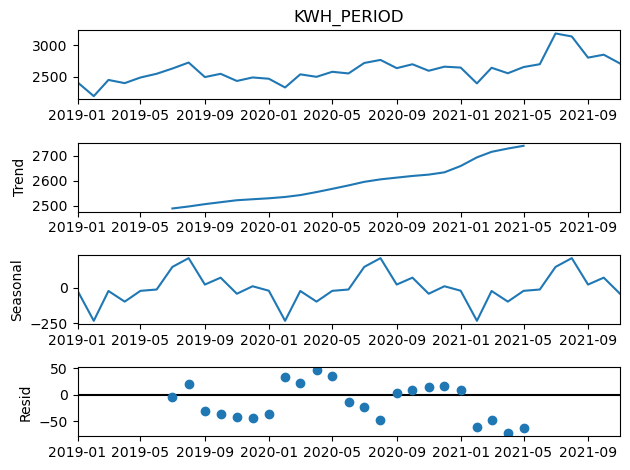

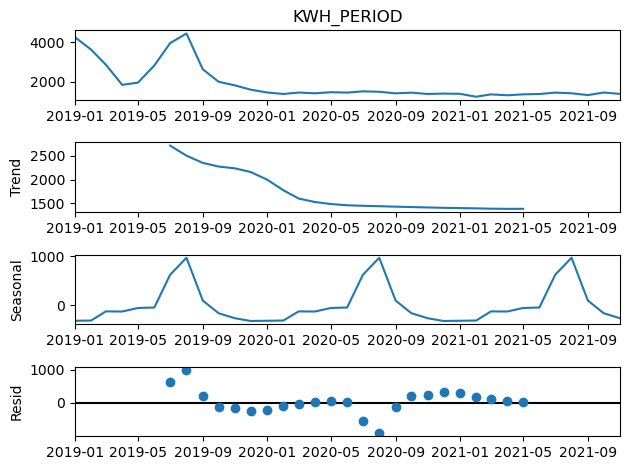

...

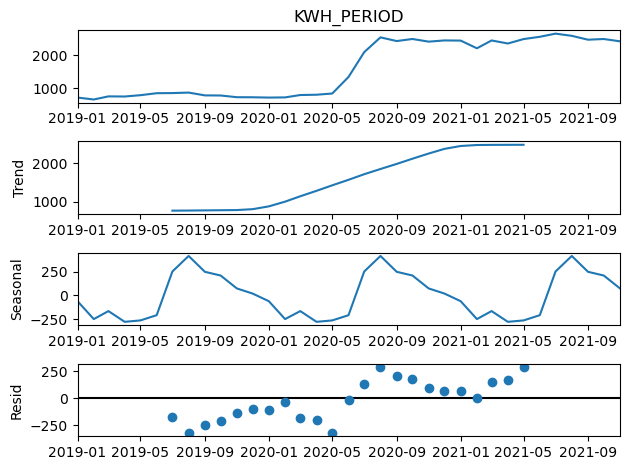

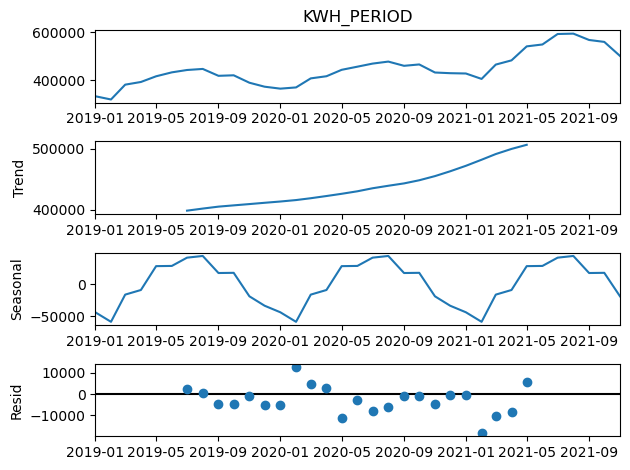

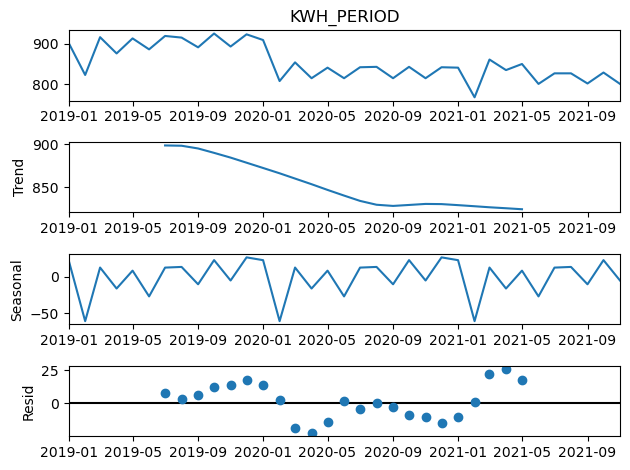

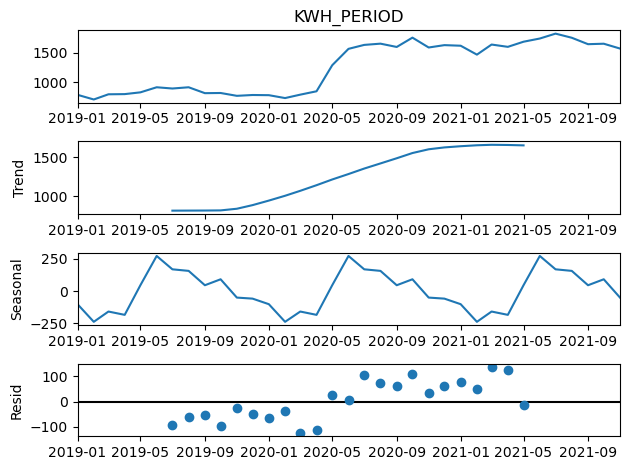

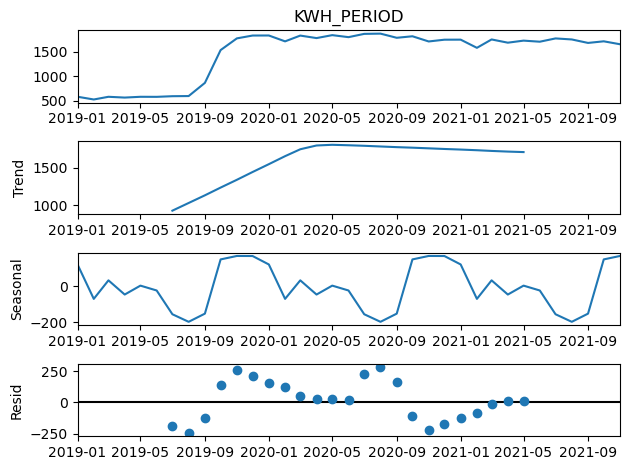

In [24]:
for i in names :
    a_i = f.loc[f.NAME== i]
    decomposition = sm.tsa.seasonal_decompose(a_i['KWH_PERIOD'], model='additive')
    fig = decomposition.plot()
    plt.show()

In [25]:
f.to_csv("C://Users//meryame.boudhar//Downloads//f_ts.csv")